In [1]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import spacy
from operator import itemgetter as it
from itertools import repeat
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt
import matplotlib
import readability
import seaborn as sns
import pyphen
from wordcloud import WordCloud
import collections

In [2]:
df=pd.read_csv('Data/notebook_aggregated_manifestos.csv')
df.head()

,Unnamed: 0,year,participation,party_name,result,text,type
0,0,DS_S,61.40,Store,11.00,www.afd.de/europawahlprogramm EUROPAWAHLPROGR...,.
1,1,1949,78.49,CDUCSU,31.01,Düsseldorfer Leitsätze vom 15. Juli 1949 Das ...,b
2,2,1949,78.49,FDP,11.92,BREMER PLATTFORM 1949 Beschlüsse des 1. Bunde...,b
3,3,1949,78.49,Linke,NaN,"Einheit, Frieden, Wohlstand Aus dem Wahlprogra...",b
4,4,1949,78.49,SPD,29.22,Für ein freies Deutschland Wählerinnen und ...,b


In [48]:
def min_max_norm(arr):
    arr=arr+arr.min()
    return (arr - arr.min()) / (arr.max() - arr.min())*100

def time_100(arr):
    return arr*100
        
def get_docs(df):
    df=df.loc[df['type'] == 'b']
    #df=df.loc[df['year'] == '2017']
    
    index=[]
    for idx, row in df.iterrows():
        index.append(f'{row["year"]}|{row["party_name"]}')
    
    return np.array(df.text), np.array(index)

def spacyfy(docs,nlp):
    spacyfied=[]
    for doc in docs:
        spacyfied.append(nlp(doc))
        
    return spacyfied
                     
def get_election_result(year,party):
    working_df=df.loc[df['type'] == 'b']
    res=working_df.loc[(working_df['year'] == year) & (working_df['party_name'] == party)]['result'].values
    if len(res)==1:
        return res[0]
    
    return 0

def filter_stopwords_and_lemmatize(spacyfied,return_type='String'):
    docs=[]
    for doc in spacyfied:
        document=[]
        for token in doc:
            if not token.is_stop and not token.is_digit:
                if return_type=='String':
                     document.append(str(token.lemma_).lower())
                else:
                     token=str(token.lemma_).lower()
                     if len(token)>1:
                         document.append(token)
        if return_type=='String':
            docs.append(' '.join(document))
        else:
            docs.append(document)      
    return docs

def vectorize(docs,index,tfidf=True):
    if tfidf:
        vectorizer = TfidfVectorizer()
    else:
        vectorizer = CountVectorizer()
    tfidf_matrix = vectorizer.fit_transform(docs)
    df = pd.DataFrame(tfidf_matrix.toarray(), columns = vectorizer.get_feature_names())
                     
    df.set_index(pd.Index(index),inplace=True)
    
    return df
                     
def df_from_readability_and_index(readability,index):
    
    mapping={}
    partys=set()
    years=set()
    for idx, element in enumerate(index):
        year,party=element.split('|')
        partys.add(party)
        years.add(year)
        mapping[element]=readability[idx]
    
    
    partys=sorted(partys)
    years=sorted(years)

    party_results={}
    for party in partys:
        party_res=[]
        for year in years:
            result=mapping.get(f'{year}|{party}')
            if result is not None:
                party_res.append(result*100)
            else:
                party_res.append(0)
            
        party_results[party]=party_res

    readability_df=pd.DataFrame(party_results).fillna(0)
    readability_df.index=years
    
    return readability_df

def get_n_max_words(df,n=20):
    return [list(zip(repeat(row.name), map(it(0), sorted(row[1:].iteritems(), key=it(1) ,reverse=1)[:n])))
                     for _, row in df.iterrows()]
def extract_interesting_word_from_lists(interesting_word_lists):
    interesting_words=set()
    for sub_list in interesting_word_lists:
        for tupel in sub_list:
            interesting_words.add(tupel[1])
            
    return list(interesting_words)
                     
def dim_reduction(df,method='PCA'):
    dims=2
    x = df.loc[:].values
    y = np.array(df.index)
    
    if method=='TSNE':
        x_embedded = TSNE(n_components=dims,random_state=1).fit_transform(x)
        
    elif method=='UMAP':
        x_embedded = umap.UMAP(n_components=dims,random_state=1).fit_transform(x)
    
    else:
        x_embedded = PCA(n_components=dims,random_state=1).fit_transform(x)
    
    
    columns=[]
    for i in range(0,dims):
        columns.append('dimension '+str(i+1))
    principalDf = pd.DataFrame(data = x_embedded, columns = columns)
    principalDf.index=y
    principalDf['year'] = list(map(lambda x: x.split('|')[0], principalDf.index))
    principalDf['party'] = list(map(lambda x: x.split('|')[1], principalDf.index))
    
    return principalDf
                     
def dim_reduction_words(df,method='PCA'):
    dims=2
    x = df.loc[:].values
    y = np.array(df.index)
    
    if method=='TSNE':
        x_embedded = TSNE(n_components=dims,random_state=1).fit_transform(x)
        
    elif method=='UMAP':
        x_embedded = umap.UMAP(n_components=dims,random_state=1).fit_transform(x)
    
    else:
        x_embedded = PCA(n_components=dims,random_state=1).fit_transform(x)
    
    
    columns=[]
    for i in range(0,dims):
        columns.append('dimension '+str(i+1))
    principalDf = pd.DataFrame(data = x_embedded, columns = columns)
    principalDf.index=y
#     principalDf['year'] = list(map(lambda x: x.split('|')[0], principalDf.index))
#     principalDf['party'] = list(map(lambda x: x.split('|')[1], principalDf.index))
    
    return principalDf

color_dict= {
    'CDUCSU': '#343434',
    'SPD': '#cc0000',
    'FDP': '#ffe800',
    'Linke': '#900C3F',
    'Gruene': '#029e00',
    'AFD': '#21a1ff',
    }

brighter_color_dict= {
    'CDUCSU': '#787878',
    'SPD': '#ff4444',
    'FDP': '#fffc44',
    'Linke': '#d44F7F',
    'Gruene': '#46df44',
    'AFD': '#65e5ff',
    }

def colors_of(df):
    return list(map(lambda x: color_dict[x], df['party']))
    
def color_of(party):
    return color_dict[party]

def brighter_color_of(party):
    return brighter_color_dict[party]
      

def plot_scatter_data(principalDf,title=''):
    fig = plt.figure(figsize = (15,15))
    
    ax1 = fig.add_subplot(1,1,1)
        
    ax1.set_xlabel(principalDf.columns[0], fontsize = 15)
    ax1.set_ylabel(principalDf.columns[1], fontsize = 15)
    
    ax1.set_title(title, fontsize = 15)
    labels=principalDf.index
    colors=colors_of(principalDf)
    
    x_data=principalDf['dimension 1']
    y_data=principalDf['dimension 2']
    
    for idx, label in enumerate(labels):
        color=colors[idx]
        indicesToKeep = principalDf.index == label
        x_data=principalDf.loc[indicesToKeep, principalDf.columns[0]]
        y_data=principalDf.loc[indicesToKeep, principalDf.columns[1]]
        ax1.scatter(x_data, y_data, c = color, s = get_election_result(principalDf['year'][idx],principalDf['party'][idx])*100)
        #ax1.text(x_data, y_data,label.split('|')[0],fontsize=readability_scores[idx]*20+5)
        ax1.text(x_data, y_data,label.split('|')[0],fontsize=word_lengths[idx]+1)
    

    artists=[]
    for party in list(dict.fromkeys(principalDf['party'])):
        artists.append(matplotlib.patches.Circle(-1,color=color_of(party),radius=0.05))         
    if len(artists)<10:
        ax1.legend(artists,list(dict.fromkeys(principalDf['party'])))

def plot_words(principalDf,title=''):
    fig = plt.figure(figsize = (15,15))
    
    ax1 = fig.add_subplot(1,1,1)
        
    ax1.set_xlabel(principalDf.columns[0], fontsize = 15)
    ax1.set_ylabel(principalDf.columns[1], fontsize = 15)
    
    ax1.set_title(title, fontsize = 15)
    labels=principalDf.index
    
    x_data=principalDf['dimension 1']
    y_data=principalDf['dimension 2']
    
    for idx, label in enumerate(labels):
        indicesToKeep = principalDf.index == label
        x_data=principalDf.loc[indicesToKeep, principalDf.columns[0]]
        y_data=principalDf.loc[indicesToKeep, principalDf.columns[1]]
        ax1.scatter(x_data, y_data, c = color_of(word_party_dict[label]), s = 5)
        #ax1.text(x_data, y_data,label.split('|')[0],fontsize=readability_scores[idx]*20+5)
        ax1.text(x_data, y_data,label,fontsize=12,color=color_of(word_party_dict[label]))
                     
def manifesto_csv_m(principal_dfs):
    
    dims=[]
    for df in principal_dfs:
        dims.append((min_max_norm(np.array(df['dimension 1'])),min_max_norm(np.array(df['dimension 2']))))
                     
    labels=principal_dfs[0].index
    partys=[]
    years=[]
    colors=[]
    fontcolors=[]
    sizes=[]
    fontsizes=[]

    
    for idx, label in enumerate(labels):
        year=label.split('|')[0]
        party=label.split('|')[1]
        sizes.append(get_election_result(year,party))
        fontsizes.append(12)
        partys.append(party)
        years.append(year)
        colors.append(color_of(party))
        fontcolors.append(color_of(party))
                     
                     
    data_tuples=list(zip(labels,partys,years,colors,fontcolors,sizes,fontsizes))
    output_df=pd.DataFrame(data_tuples, columns=['label','party','year','color','fontcolor','size','fontsize'])
    
    
    for i, method in enumerate(dims):
        for j, dim in enumerate(method):
            output_df[f'dim{i+1}{j+1}']=dim
    output_df=output_df.fillna(0)               
    output_df.to_csv('bubbles_data3.csv',index=False)
    
    return output_df

    
def words_csv(principalDf):
    
    principalDf['label']=principalDf.index
    colors=[]
    fontcolors=[]                 
    sizes=[]
    fontsizes=[]
    partys=[]
    for label in principalDf.index:
        colors.append(color_of(word_party_dict[label]))
        fontcolors.append(color_of(word_party_dict[label]))
        sizes.append(10)
        fontsizes.append(12)
        partys.append(word_party_dict[label])
    principalDf['color']=np.array(colors)
    principalDf['fontcolor']=np.array(fontcolors)
    principalDf['size']=np.array(sizes)
    principalDf['fontsize']=np.array(fontsizes)
    principalDf['party']=np.array(partys)
                     
    principalDf.columns=['dim1','dim2','label','color','fontcolor','size','fontsize','party']
                     
    principalDf.to_csv('bubbles_data1.csv',index=False)
                     
def words_csv_m(principal_dfs):
    
                     
    dims=[]
    for df in principal_dfs:
        dims.append((min_max_norm(np.array(df['dimension 1'])),min_max_norm(np.array(df['dimension 2']))))
    
                     
    labels=np.array(principal_dfs[0].index)
    colors=[]
    fontcolors=[]                 
    sizes=[]
    fontsizes=[]
    partys=[]
    for label in labels:
        colors.append(color_of(word_party_dict[label]))
        fontcolors.append(color_of(word_party_dict[label]))
        sizes.append(10)
        fontsizes.append(12)
        partys.append(word_party_dict[label])
                     
    data_tuples=list(zip(labels,partys,colors,fontcolors,sizes,fontsizes))
    output_df=pd.DataFrame(data_tuples, columns=['label','party','color','fontcolor','size','fontsize'])
    
    
    for i, method in enumerate(dims):
        for j, dim in enumerate(method):
            output_df[f'dim{i+1}{j+1}']=dim
                     
    output_df.to_csv('bubbles_data2.csv',index=False)
                     
    return output_df
                     
def words_csv_years(principal_dfs):
    
                     
    dims=[]
    for df in principal_dfs:
        dims.append((min_max_norm(np.array(df['dimension 1'])),min_max_norm(np.array(df['dimension 2']))))
    
                     
    labels=np.array(principal_dfs[0].index)
    colors=[]
    fontcolors=[]                 
    sizes=[]
    fontsizes=[]
    partys=[]
    for label in labels:
        colors.append(color_of(word_party_dict[label]))
        fontcolors.append(color_of(word_party_dict[label]))
        sizes.append(10)
        fontsizes.append(12)
        partys.append(word_party_dict[label])
    
    here_years=sorted(set(years))
    all_years=[]
    for year in here_years:
        scores=[]
        for label in labels:
            scores.append(get_scores_for_word_and_year(vectorized_years_df,label,year))
        all_years.append(min_max_norm(np.array(scores)))
    
    data_tuples=list(zip(labels,partys,colors,fontcolors,sizes,fontsizes))
    output_df=pd.DataFrame(data_tuples, columns=['label','party','color','fontcolor','size','fontsize'])
    
    
    for i, method in enumerate(dims):
        for j, dim in enumerate(method):
            output_df[f'dim{i+1}{j+1}']=dim
                     
    for i, year in enumerate(here_years):
            output_df[f'size_{year}']=all_years[i]
                     
    output_df.to_csv('bubbles_data4.csv',index=False)
                     
    return output_df

In [4]:
docs,index=get_docs(df)

In [5]:
nlp = spacy.load('de')
spacified=spacyfy(docs,nlp)

In [6]:
docs_filtered=filter_stopwords_and_lemmatize(spacified)

# ------------------------------------------------------
# Election Results and Readability

In [7]:
text = ('Das ist, unter diesen Umständen, ein viel komplexerer Satz.\n')
results = readability.getmeasures(text, lang='de')
print(results['readability grades'])

OrderedDict([('Kincaid', 7.58666666666667), ('ARI', 8.189999999999998), ('Coleman-Liau', 12.270925777777776), ('FleschReadingEase', 56.70000000000001), ('GunningFogIndex', 8.044444444444444), ('LIX', 31.22222222222222), ('SMOGIndex', 8.477225575051662), ('RIX', 2.0), ('DaleChallIndex', 9.346233333333332)])


In [8]:
def compute_readability_scores(docs):
    readability_scores=[]
    for doc in docs:
        readability_scores.append(readability.getmeasures(doc, lang='de')['readability grades']['FleschReadingEase'])
    
    readability_scores=np.array(readability_scores)                
    return 1-((readability_scores-np.amin(readability_scores))/(np.amax(readability_scores)-np.amin(readability_scores))+0.1)/1.1

def word_freqs(document):
    counter = collections.Counter()
    for word in document:
        counter[word.text] += 1
    
    return counter

def get_times_of_occurences(counter_dict):  
    c = collections.Counter( counter_dict.values() )
    
    c=collections.OrderedDict(sorted(c.items(), key=lambda t: t[0]))
    return c
    
def count_syllables(word):
    dic = pyphen.Pyphen(lang='de')
    return len(dic.inserted(word).split('-'))
def count_metrics(spacified):
    doc_sentences=[]
    doc_words=[]
    doc_characters=[]
    doc_syllables=[]
    simpson=[]
    hapax_legomena=[]
    hapax_dislegomena=[]
    for doc in spacified:
        for cs, sentence in enumerate(doc.sents):
            continue
        doc_sentences.append(cs+1)
        
        character_count=0
        syllable_count=0
        for cw, word in enumerate(doc):
            character_count+=len(word)
            syllable_count+=count_syllables(word.text)
        word_nr=cw+1
        doc_words.append(word_nr)
        doc_syllables.append(syllable_count)
        doc_characters.append(character_count)
        
        occs=get_times_of_occurences(word_freqs(doc))
        
        simpson_sum=0
        for key,value in occs.items():
            simpson_sum+=key*(key-1)*value
        simpson.append(simpson_sum/(word_nr*(word_nr-1)))
        
        hapax_legomena.append(occs[1])
        hapax_dislegomena.append(occs[2])
        
    return np.array(doc_sentences), np.array(doc_words), np.array(doc_syllables), np.array(doc_characters), np.array(simpson), np.array(hapax_legomena),np.array(hapax_dislegomena)

In [9]:
a,b,c,d,e,f,g=count_metrics(spacified)
asl=b/a#avg words per sentence
asw=c/b#avg syllables per word

fre=206.835-(1.015*asl)-(84.6*asw)
fre_deutsch=180-asl-(58.5*asw)


word_lengths=min_max_norm(b)

sentence_lengths=min_max_norm(a)

character_lengths=min_max_norm(d)

avg_sents=min_max_norm(asl)

avg_words=min_max_norm(asw)

simpson_indices=min_max_norm(e)

hapax_legomena=time_100(f/b)
hapax_dislegomena=time_100(g/b)

readability_scores=min_max_norm(fre_deutsch)#(fre_deutsch - fre_deutsch.min()) / (fre_deutsch.max() - fre_deutsch.min())

temp_df=df.loc[df['type'] == 'b']
party_colors=[color_of(party) for party in temp_df.party_name]
data_tuples=list(zip(temp_df.year,temp_df.party_name,party_colors,temp_df.result.fillna(0),readability_scores,simpson_indices,hapax_legomena,hapax_dislegomena,word_lengths,sentence_lengths,character_lengths,avg_sents,avg_words))
output_df=pd.DataFrame(data_tuples, columns=['year','party','color','result','readability','simpson','hapax_legomena','hapax_dislegomena','word_number','sentence_number','character_number','avg_sents','avg_words'])
#output_df=output_df.loc[output_df['party'] == 'CDUCSU']
#output_df.to_csv('12test.csv',index=False)
output_df.head()

,year,party,color,result,readability,simpson,hapax_legomena,hapax_dislegomena,word_number,sentence_number,character_number,avg_sents,avg_words
0,1949,CDUCSU,#343434,31.01,58.478670,28.437921,20.149917,4.446703,7.886473,7.439069,7.943902,61.455287,40.393491
1,1949,FDP,#ffe800,11.92,46.924418,30.586266,21.690440,4.573854,8.546916,6.384140,8.455985,92.849799,39.903447
2,1949,Linke,#900C3F,0.00,63.715179,43.402247,26.727411,4.669704,2.234932,1.873409,2.174189,70.141381,29.249183
3,1949,SPD,#cc0000,29.22,77.618872,41.019053,31.818182,5.017153,1.909027,1.891597,1.827858,53.196150,19.504911
4,1953,CDUCSU,#343434,45.17,52.854351,27.566036,24.983240,4.245810,4.221659,4.328847,4.333021,51.213021,52.815962


In [10]:
readability_scores=compute_readability_scores(docs)
readability_scores[:10]

array([0.07221391, 0.07881718, 0.02069609, 0.01775299, 0.03934647,
       0.01426763, 0.05193263, 0.0008375 , 0.01028791, 0.0244393 ])

In [11]:
readability_df=df_from_readability_and_index(readability_scores,index)

In [12]:
b_df=df.loc[df['type'] == 'b']
partys=sorted(set(b_df['party_name']))
years=sorted((set(b_df['year'])))

party_results={}
for party in partys:
    party_res=[]
    for year in years:
        party_res.append(get_election_result(year,party))
    party_results[party]=party_res
    
result_df=pd.DataFrame(party_results).fillna(0)
result_df.index=years

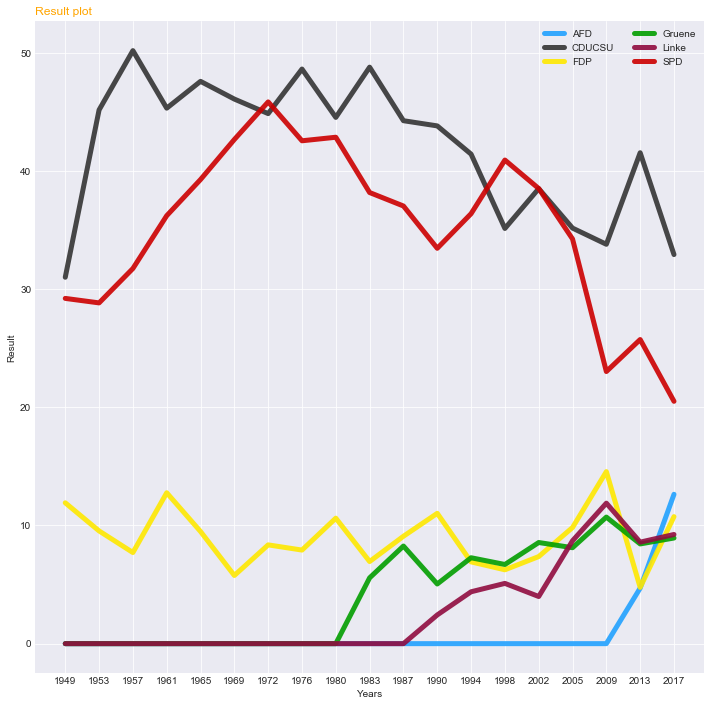

In [13]:
def plot_results(result_df):
    # style
    plt.style.use('seaborn-darkgrid')
    plt.figure(figsize=(12,12))
    # create a color palette
    palette = plt.get_cmap('Set1')

    # multiple line plot
    for column in result_df:
        plt.plot(result_df.index, result_df[column], marker='', color=color_of(column), linewidth=5, alpha=0.9, label=column)

    # Add legend
    plt.legend(loc=1, ncol=2)

    # Add titles
    plt.title("Result plot", loc='left', fontsize=12, fontweight=0, color='orange')
    plt.xlabel("Years")
    plt.ylabel("Result")

plot_results(result_df)

D:\Anaconda\envs\stdenv\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
D:\Anaconda\envs\stdenv\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
D:\Anaconda\envs\stdenv\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
D:\Anaconda\envs\stdenv\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWar

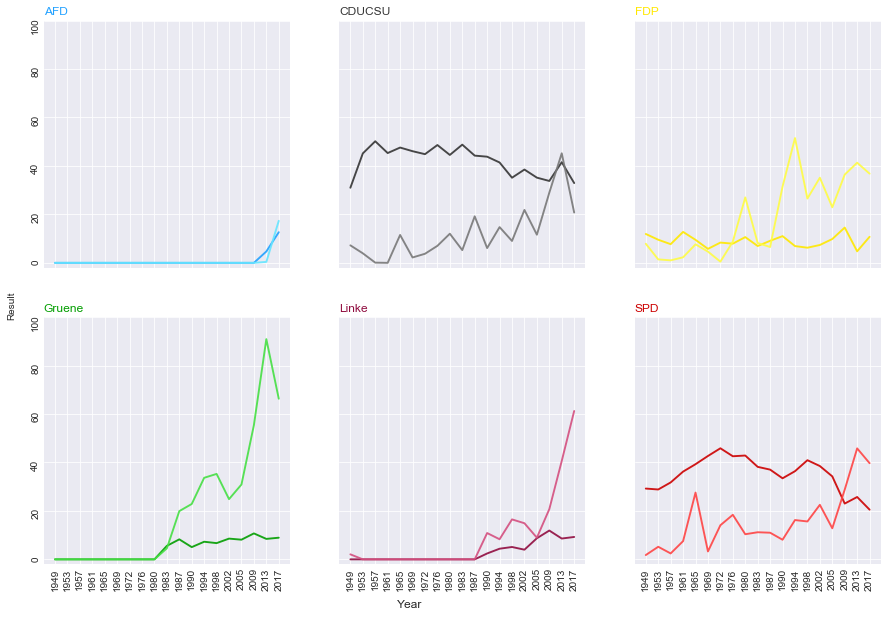

In [14]:
def plot_results_with_readability(result_df,readability_df):
    # Initialize the figure
    plt.style.use('seaborn-darkgrid')
    plt.figure(figsize=(15,10))
    # multiple line plot
    num=0
    for column in result_df:
        num+=1

        # Find the right spot on the plot
        plt.subplot(2,3, num)

        # Plot the lineplot
        plt.plot(result_df.index, result_df[column], marker='', color=color_of(column), linewidth=1.9, alpha=0.9, label=column)
        plt.plot(readability_df.index, readability_df[column], marker='', color=brighter_color_of(column), linewidth=1.9, alpha=0.9, label=column)


        #plt.xlim(0,)
        plt.ylim(-2,100)
        plt.tick_params(labelrotation=90)
        # Not ticks everywhere
        if num in [1,2,3] :
            plt.tick_params(labelbottom='off')
        if num not in [1,4] :
            plt.tick_params(labelleft='off')

        # Add title
        plt.title(column, loc='left', fontsize=12, fontweight=0, color=color_of(column) )
    # general title
    plt.suptitle('', fontsize=13, fontweight=0, color='black', style='italic', y=1.02)

    # Axis title
    plt.text(-20, -20, 'Year',fontsize=12)
    plt.text(-51, 105, 'Result', ha='center', va='center', rotation='vertical')

#FRE - Readability
plot_results_with_readability(result_df,readability_df)

D:\Anaconda\envs\stdenv\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
D:\Anaconda\envs\stdenv\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
D:\Anaconda\envs\stdenv\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
D:\Anaconda\envs\stdenv\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWar

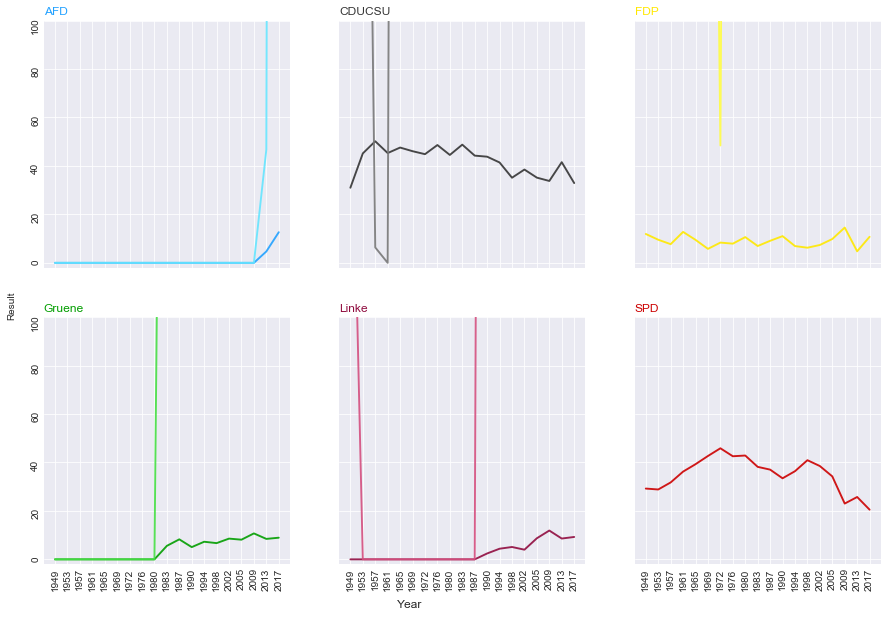

In [15]:
# word lenghts
plot_results_with_readability(result_df,df_from_readability_and_index(word_lengths,index))

# ------------------------------------------------------
# TF-IDF, Vector Space, Dimension Reduction

In [26]:
vectorized_df=vectorize(docs_filtered,index,tfidf=True)
vectorized_df.head()

,00,000,001,004,01,0190er,03,044,048,050,...,übrigen,übung,übungsgelände,übungskapazitäten,übungsleiter,übungsleitern,übungsleiterpauschale,übungsplätze,übungsstätten,üö0
1949|CDUCSU,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1949|FDP,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1949|Linke,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1949|SPD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1953|CDUCSU,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
interesting_word_lists=get_n_max_words(vectorized_df,n=100)
    
interesting_words=extract_interesting_word_from_lists(interesting_word_lists)
interesting_words[:10]

['mein',
 'mehrkinderfamilien',
 'rußland',
 'wende',
 'brüters',
 'schau',
 'volksaktien',
 'kirchentagen',
 'verlangen',
 'rhöndorfer']

In [28]:
vectorized_df[interesting_words].head()

,mein,mehrkinderfamilien,rußland,wende,brüters,schau,volksaktien,kirchentagen,verlangen,rhöndorfer,...,70er,80er,einsiedelung,humanisierung,zielsetzung,telefon,abenteuer,getragen,anerkennungsforderungen,berechtigungswesen
1949|CDUCSU,0.028489,0.0,0.0,0.008425,0.0,0.0,0.0,0.0,0.022135,0.0,...,0.0,0.0,0.00000,0.0,0.008039,0.0,0.0,0.000000,0.0,0.0
1949|FDP,0.049697,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.017821,0.0,...,0.0,0.0,0.00000,0.0,0.006472,0.0,0.0,0.000000,0.0,0.0
1949|Linke,0.076761,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.069580,0.0,...,0.0,0.0,0.00000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0
1949|SPD,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.012154,0.0,...,0.0,0.0,0.04695,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0
1953|CDUCSU,0.050636,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.016861,0.0,...,0.0,0.0,0.00000,0.0,0.000000,0.0,0.0,0.039062,0.0,0.0


## D3 Dataframes

In [29]:
def get_specific_docs(docs,specificities):
    set_specificities=sorted(set(specificities))
    
    specificity_docs=[]
    for specificity in set_specificities:
        specificity_doc=''
        for doc, doc_specificity in zip(docs,specificities):
            if specificity==doc_specificity:
                specificity_doc+=doc+'\n'
            
        specificity_docs.append(specificity_doc)
    
    #print(len(specificity_docs))
    return specificity_docs

def get_scores_for_word_and_year(vectorized_years_df,word,year):
    return vectorized_years_df[word].loc[year]


In [30]:
years=df.loc[df['type'] == 'b']['year']
partys=df.loc[df['type'] == 'b']['party_name']
vectorized_years_df=vectorize(get_specific_docs(docs_filtered,years),sorted(set(years)),tfidf=True)
vectorized_partys_df=vectorize(get_specific_docs(docs_filtered,partys),sorted(set(partys)),tfidf=True)
vectorized_years_df.head()

,00,000,001,004,01,0190er,03,044,048,050,...,übrigen,übung,übungsgelände,übungskapazitäten,übungsleiter,übungsleitern,übungsleiterpauschale,übungsplätze,übungsstätten,üö0
1949,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1957,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1965,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.004442,0.0


In [31]:
def create_word_party_dict():
    dic={}
    working_df=vectorized_partys_df.transpose()
    for word, party in zip(working_df.index, working_df.idxmax(axis=1)):
        dic[word]=party
    return dic

word_party_dict=create_word_party_dict()

In [32]:
words_csv(dim_reduction_words(vectorized_partys_df[extract_interesting_word_from_lists(get_n_max_words(vectorized_partys_df,n=100))].transpose(),method='TSNE'))

In [33]:
temp_df=vectorized_partys_df[extract_interesting_word_from_lists(get_n_max_words(vectorized_partys_df,n=100))].transpose()
principial_dfs=[]
principial_dfs.append(dim_reduction_words(temp_df,method='TSNE'))
principial_dfs.append(dim_reduction_words(temp_df,method='UMAP'))
principial_dfs.append(dim_reduction_words(temp_df,method='PCA'))
words_csv_m(principial_dfs).head()

,label,party,color,fontcolor,size,fontsize,dim11,dim12,dim21,dim22,dim31,dim32
0,förderung,FDP,#ffe800,#ffe800,10,12,24.960131,35.799995,88.784500,77.498573,23.238128,11.723092
1,staatlich,AFD,#21a1ff,#21a1ff,10,12,72.467262,59.450920,55.050159,50.318176,15.395279,23.328535
2,mein,CDUCSU,#343434,#343434,10,12,20.991875,14.406645,100.000000,87.659431,36.490879,16.003396
3,zusammenarbeit,SPD,#cc0000,#cc0000,10,12,28.505701,69.583282,83.640633,55.371346,14.795671,13.971982
4,forschung,FDP,#ffe800,#ffe800,10,12,36.721325,62.458313,76.871948,58.210300,14.839790,16.283268


In [34]:
temp_df=vectorized_partys_df[extract_interesting_word_from_lists(get_n_max_words(vectorized_partys_df,n=100))].transpose()
principial_dfs=[]
principial_dfs.append(dim_reduction_words(temp_df,method='TSNE'))
principial_dfs.append(dim_reduction_words(temp_df,method='UMAP'))
principial_dfs.append(dim_reduction_words(temp_df,method='PCA'))
words_csv_years(principial_dfs).head()

,label,party,color,fontcolor,size,fontsize,dim11,dim12,dim21,dim22,...,size_1983,size_1987,size_1990,size_1994,size_1998,size_2002,size_2005,size_2009,size_2013,size_2017
0,förderung,FDP,#ffe800,#ffe800,10,12,24.960131,35.799995,88.784500,77.498573,...,15.662651,20.543039,37.509039,36.545108,24.945170,35.078534,27.058824,30.297030,21.653543,14.774282
1,staatlich,AFD,#21a1ff,#21a1ff,10,12,72.467262,59.450920,55.050159,50.318176,...,15.662651,15.765588,24.424491,24.776344,14.336305,18.848168,11.470588,16.237624,10.892388,12.722298
2,mein,CDUCSU,#343434,#343434,10,12,20.991875,14.406645,100.000000,87.659431,...,69.879518,27.709215,15.701458,22.918118,20.644279,22.513089,24.411765,34.455446,49.343832,31.326949
3,zusammenarbeit,SPD,#cc0000,#cc0000,10,12,28.505701,69.583282,83.640633,55.371346,...,21.686747,17.676568,18.318368,17.962850,14.623031,17.015707,10.000000,11.485149,16.666667,11.491108
4,forschung,FDP,#ffe800,#ffe800,10,12,36.721325,62.458313,76.871948,58.210300,...,4.819277,10.032647,13.520700,20.130780,15.196483,25.392670,20.000000,19.405941,17.322835,12.311902


In [35]:
#vectorized_years_df[extract_interesting_word_from_lists(get_n_max_words(vectorized_years_df,n=100))]

In [36]:
temp_df=vectorized_partys_df[extract_interesting_word_from_lists(get_n_max_words(vectorized_partys_df,n=100))].transpose()
principial_dfs=[]
principial_dfs.append(dim_reduction_words(vectorized_df,method='TSNE'))
principial_dfs.append(dim_reduction_words(vectorized_df,method='UMAP'))
principial_dfs.append(dim_reduction_words(vectorized_df,method='PCA'))
manifesto_csv_m(principial_dfs).head()

,label,party,year,color,fontcolor,size,fontsize,dim11,dim12,dim21,dim22,dim31,dim32
0,1949|CDUCSU,CDUCSU,1949,#343434,#343434,31.01,12,16.052116,78.054848,100.000000,59.416370,81.320437,36.276790
1,1949|FDP,FDP,1949,#ffe800,#ffe800,11.92,12,10.509017,70.958946,95.035713,49.391331,89.542962,45.706057
2,1949|Linke,Linke,1949,#900C3F,#900C3F,0.00,12,5.811682,83.769409,97.008560,78.707237,93.314122,41.627771
3,1949|SPD,SPD,1949,#cc0000,#cc0000,29.22,12,0.000000,76.687279,97.947433,71.683403,86.683826,43.991103
4,1953|CDUCSU,CDUCSU,1953,#343434,#343434,45.17,12,16.631844,85.161201,93.967522,84.230820,86.673702,30.483986


In [37]:
test_df=vectorized_df[interesting_words]

## Matplotlib Charts

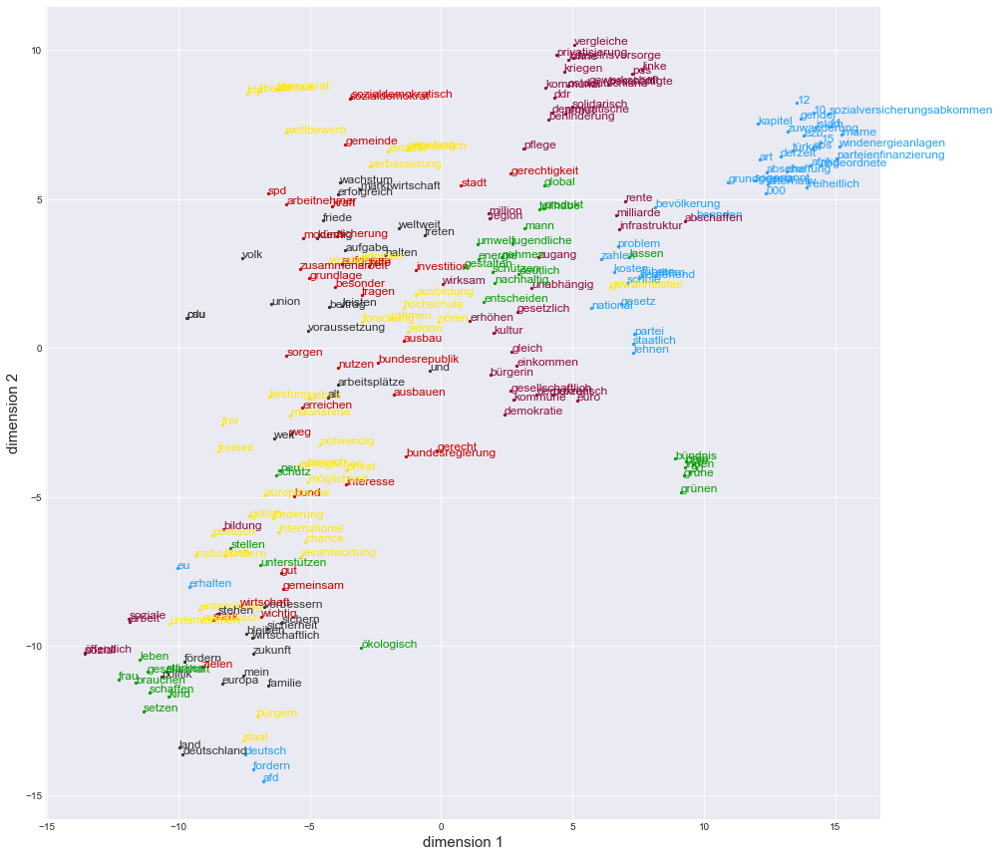

In [38]:
plot_words(dim_reduction_words(vectorized_partys_df[extract_interesting_word_from_lists(get_n_max_words(vectorized_partys_df,n=100))].transpose(),method='TSNE'))

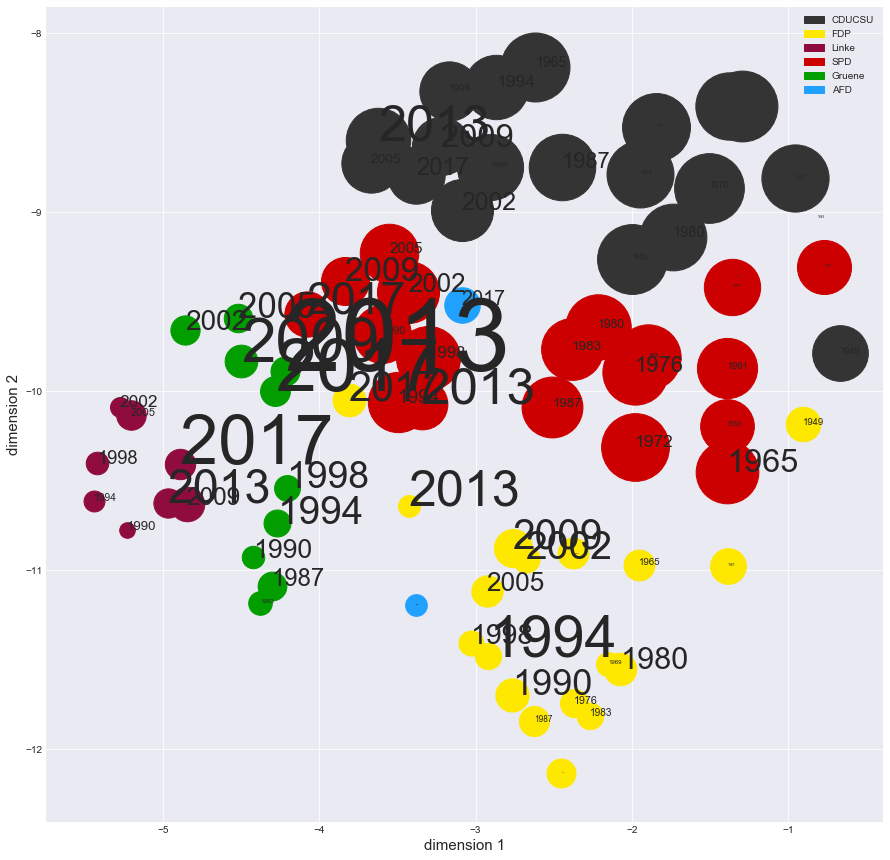

In [49]:
plot_scatter_data(dim_reduction(vectorized_df,method='UMAP'))

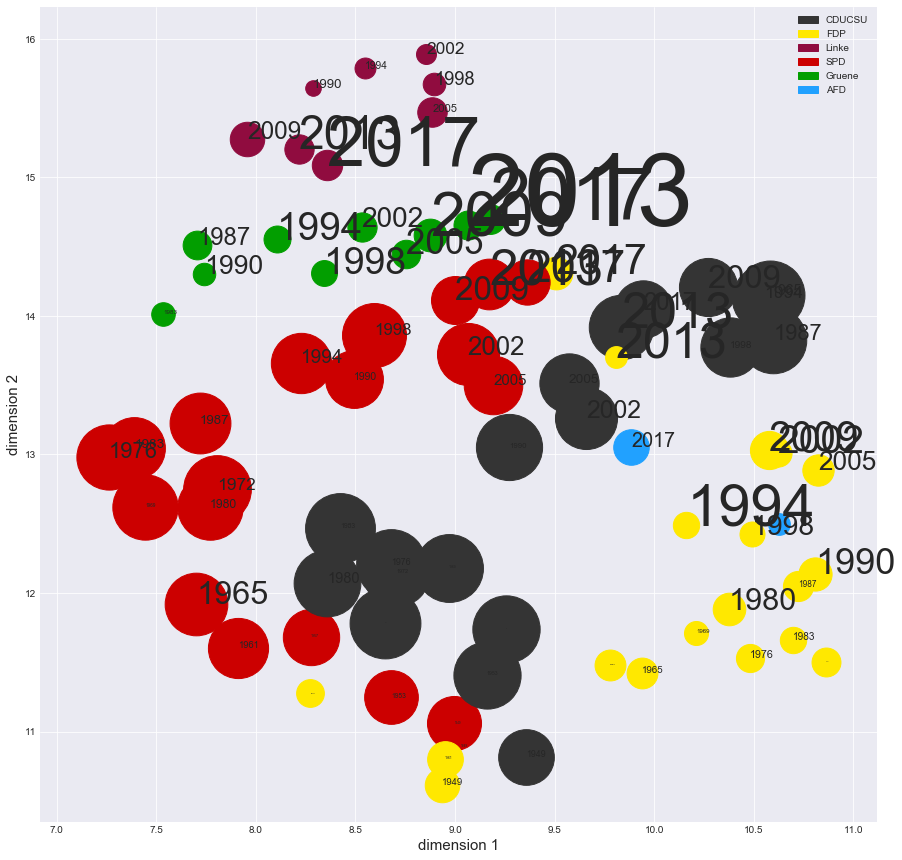

In [50]:
plot_scatter_data(dim_reduction(vectorized_df[interesting_words],method='UMAP'))

# experimental

In [41]:
docs_tokenized=filter_stopwords_and_lemmatize(spacified,return_type='Token')

In [42]:
def partyfy_docs(docs_tokenized):
    partified_docs=[]
    for doc in docs_tokenized:
        partified_doc=[]
        for token in doc:
            dominant_party=word_party_dict.get(token)
            if dominant_party is None:
                dominant_party='unknown'
            partified_doc.append((token,dominant_party))
        partified_docs.append(partified_doc)
    return partified_docs

partified_docs=partyfy_docs(docs_tokenized)

In [43]:
def get_dominance_values(partified_docs,exclude_best=True):
    dominant_party_term_docs=[]
    for doc in partified_docs:
        counter=collections.OrderedDict(sorted(collections.Counter(x[1] for x in doc).items()))
        if exclude_best:
            counter.pop(max(counter, key=counter.get))
        dominant_party_term_docs.append(counter)
        
    return dominant_party_term_docs


def get_dominant_term_partys(dominant_party_term_docs):
    res=[]
    for dic in dominant_party_term_docs:
        res.append(max(dic, key=dic.get))
    return res

dominant_term_partys=get_dominant_term_partys(get_dominance_values(partified_docs))

In [46]:
for idx, dom_party in zip(index[:10],dominant_term_partys[:10]):
    print(idx,dom_party)

1949|CDUCSU FDP
1949|FDP AFD
1949|Linke CDUCSU
1949|SPD CDUCSU
1953|CDUCSU FDP
1953|FDP SPD
1953|SPD FDP
1957|CDUCSU FDP
1957|FDP CDUCSU
1957|SPD CDUCSU


# ------------------------------------------------------
# Topic Modelling

In [47]:
import gensim
import gensim.corpora as corpora
topic_number=10
id2word = corpora.Dictionary(docs_tokenized)

corpus = [id2word.doc2bow(text) for text in docs_tokenized]

lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=topic_number, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=20,
                                           passes=20,
                                           alpha='auto',
                                           eta='auto',
                                           iterations=500,
                                           per_word_topics=True)

D:\Anaconda\envs\stdenv\lib\site-packages\smart_open\ssh.py:34: UserWarning: paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress
  warnings.warn('paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress')
D:\Anaconda\envs\stdenv\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


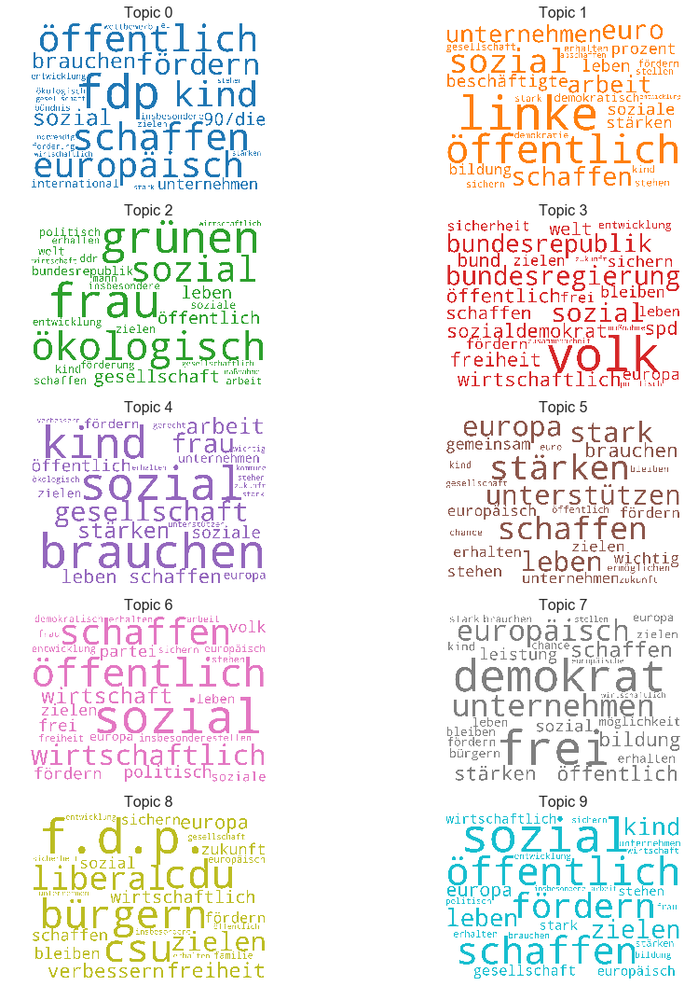

In [52]:
import matplotlib.colors as mcolors

def topic_clouds(lda_model):
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
    stop_words = list(spacy.lang.de.stop_words.STOP_WORDS)
    stop_words.extend(['deutschland','setzen','land','deutsch','politik','staat','fordern'])

    cloud = WordCloud(stopwords=stop_words,
                      background_color='white',
                      width=2500,
                      height=1800,
                      max_words=25,
                      colormap='Paired',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)

    topics = lda_model.show_topics(formatted=False,num_words=50)

    fig, axes = plt.subplots(5, 2, figsize=(15,15), sharex=True, sharey=True)

    for i, ax in enumerate(axes.flatten()):
        fig.add_subplot(ax)
        topic_words = dict(topics[i][1])

        for stop_word in stop_words:
            if stop_word in topic_words.keys():
                topic_words.pop(stop_word)
        cloud.generate_from_frequencies(topic_words, max_font_size=500)
        plt.gca().imshow(cloud)
        plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')


    plt.subplots_adjust(wspace=0, hspace=0)
    plt.axis('off')
    plt.margins(x=0, y=0)
    plt.tight_layout()
    plt.show()
    
topic_clouds(lda_model)

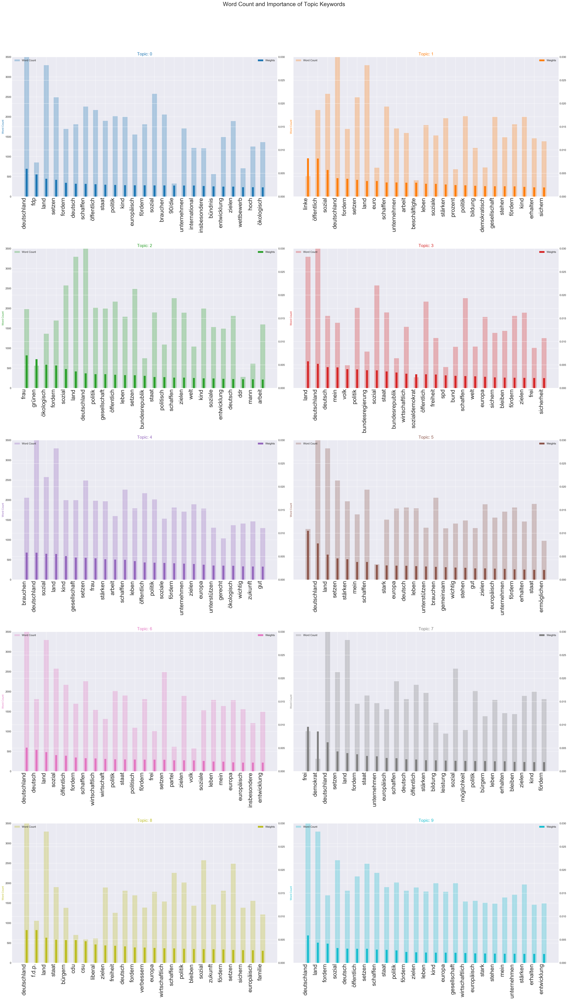

In [54]:
def topic_bars(lda_model,docs_tokenized):
    topics = lda_model.show_topics(formatted=False,num_words=25)
    data_flat = [w for w_list in docs_tokenized for w in w_list]
    counter = collections.Counter(data_flat)

    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i , weight, counter[word]])

    df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

    fig, axes = plt.subplots(5, 2, figsize=(30,50), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=90, horizontalalignment= 'right',fontsize=22)
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)    
    fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
    plt.show()
    
    #return df
    
topic_bars(lda_model,docs_tokenized)

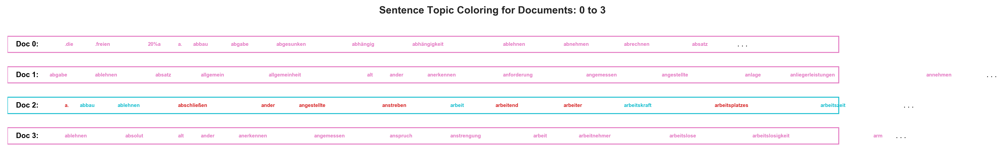

In [55]:
# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle

def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 5):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(end-start, 1, figsize=(30, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1]
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word[wd], topic[0]) for wd, topic in wordid_topics]    
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.05
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=11, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart()


# ------------------------------------------------------
# Wordclouds

In [59]:
def word_cloud(df,party,year):
    tfidf_dict=(df.transpose()[f'{year}|{party}']+0.00001).to_dict()
    wordcloud = WordCloud(background_color=color_of(party)).generate_from_frequencies(tfidf_dict)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

def result_words_df(df,year):

    results=[]
    columns=[]
    for party in partys:
        results.append(get_election_result('2017',party))
        columns.append(f'{year}|{party}')
    
    
    computed_df=(df.transpose()[columns]*np.array(results)).transpose()
    computed_df=(computed_df/computed_df.sum(axis=0)).fillna(0)
    return computed_df

result_words_df(vectorized_df[interesting_words],'2017').head()

,mein,mehrkinderfamilien,rußland,wende,brüters,schau,volksaktien,kirchentagen,verlangen,rhöndorfer,...,70er,80er,einsiedelung,humanisierung,zielsetzung,telefon,abenteuer,getragen,anerkennungsforderungen,berechtigungswesen
2017|CDUCSU,0.033644,0.0,0.0,0.040034,0.0,0.000000,0.0,0.0,0.035414,0.0,...,0.0,0.0,0.0,0.0,0.0,0.050109,0.0,0.000000,0.0,0.0
2017|FDP,0.002346,0.0,0.0,0.000000,0.0,0.052632,0.0,0.0,0.003705,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0
2017|Linke,0.000919,0.0,0.0,0.008202,0.0,0.000000,0.0,0.0,0.001209,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0
2017|SPD,0.012375,0.0,0.0,0.007705,0.0,0.000000,0.0,0.0,0.009088,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.046546,0.0,0.0
2017|CDUCSU,0.033644,0.0,0.0,0.040034,0.0,0.000000,0.0,0.0,0.035414,0.0,...,0.0,0.0,0.0,0.0,0.0,0.050109,0.0,0.000000,0.0,0.0


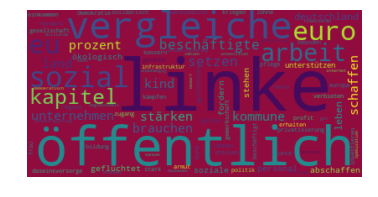

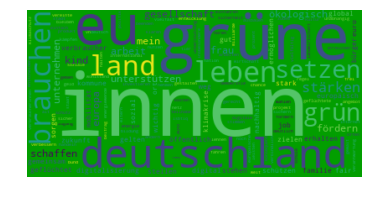

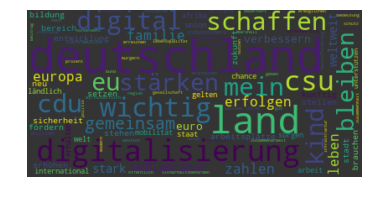

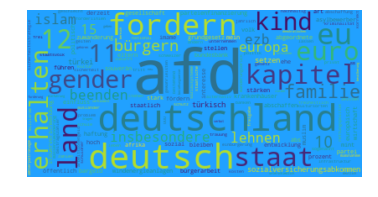

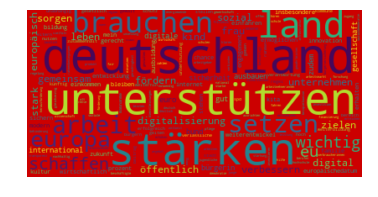

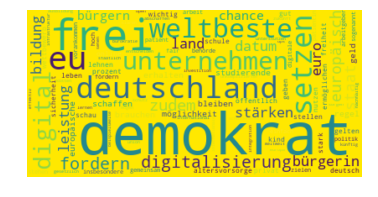

In [60]:
for party in set(partys):
    word_cloud(test_df,party,'2017')

In [62]:
#for party in partys:
#    word_cloud(result_words_df(vectorized_df[interesting_words],'2017'),party,'2017')

# ------------------------------------------------------
# Heatmaps, Piemaps

In [24]:
def heatmap(x, y, size,color,figsize):
    fig, ax = plt.subplots(figsize=figsize)
    fig
    # Mapping from column names to integer coordinates
    x_labels = x
    y_labels = y
    x_to_num = {p[1]:p[0] for p in enumerate(x_labels)} 
    y_to_num = {p[1]:p[0] for p in enumerate(y_labels)}
    
    x_scatter=[]
    y_scatter=[]
    for i, y_label in enumerate(y_labels):
        for j, x_label in enumerate(x_labels):
            x_scatter.append(j)
            y_scatter.append(i)
    
    size_scale = 500
    
    ax.scatter(
        x=x_scatter, # Use mapping for x
        y=y_scatter, # Use mapping for y
        s=size * size_scale, # Vector of square sizes, proportional to size parameter
        c=color,
        marker='o' # Use square as scatterplot marker
    )
    
    # Show column labels on the axes
    ax.set_xticks([x_to_num[v] for v in x_labels])
    ax.set_xticklabels(x_labels, rotation=45, horizontalalignment='right')
    ax.set_yticks([y_to_num[v] for v in y_labels])
    ax.set_yticklabels(y_labels)
    
    ax.grid(False, 'major')
    ax.grid(True, 'minor')
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)
    
    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])


In [54]:
def piemap(x, y, size,ratios,figsize):
    fig, ax = plt.subplots(figsize=figsize)
    fig
    # Mapping from column names to integer coordinates
    x_labels = x
    y_labels = y
    x_to_num = {p[1]:p[0] for p in enumerate(x_labels)} 
    y_to_num = {p[1]:p[0] for p in enumerate(y_labels)}
    
    x_scatter=[]
    y_scatter=[]
    for i, y_label in enumerate(y_labels):
        for j, x_label in enumerate(x_labels):
            x_scatter.append(j)
            y_scatter.append(i)
    
    colors=[color_of(party) for party in partys]

    for i,_ in enumerate(x_scatter):
        ax.pie(ratios[i], colors=colors,
               center=(x_scatter[i], y_scatter[i]), radius=size[i], frame=True)

    # Show column labels on the axes
    ax.set_xticks([x_to_num[v] for v in x_labels])
    ax.set_xticklabels(x_labels, rotation=45, horizontalalignment='right')
    ax.set_yticks([y_to_num[v] for v in y_labels])
    ax.set_yticklabels(y_labels)
    
    ax.grid(False, 'major')
    ax.grid(True, 'minor')
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)
    
    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])


In [26]:
test_df.head()

,wettbewerb,bürgergeld,juliusturm,christ,arbeiterschaft,gleichstellung,klimawandel,position,rainer,bekennen,...,wahlaufruf,ordentlich,ausschüttung,aufopfern,erfolgreich,vergossen,mittel,christlich,vielfalt,erklären
1949|CDUCSU,0.049804,0.0,0.0,0.0,0.0,0.006144,0.0,0.0,0.0,0.012127,...,0.0,0.000000,0.0,0.0,0.017260,0.0,0.060092,0.008562,0.000000,0.000000
1949|FDP,0.004455,0.0,0.0,0.0,0.0,0.004947,0.0,0.0,0.0,0.004882,...,0.0,0.045148,0.0,0.0,0.004632,0.0,0.021991,0.027572,0.004882,0.000000
1949|Linke,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.019625,0.000000,0.000000,0.000000
1949|SPD,0.000000,0.0,0.0,0.0,0.0,0.013495,0.0,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.025272,0.0,0.011998,0.056412,0.000000,0.017931
1953|CDUCSU,0.042153,0.0,0.0,0.0,0.0,0.009360,0.0,0.0,0.0,0.009237,...,0.0,0.000000,0.0,0.0,0.026295,0.0,0.041613,0.065217,0.000000,0.000000


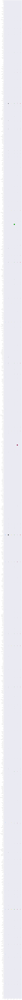

In [27]:
def plot_words_for_year(year,df,n=1000):
    colors=[]
    sizes=[]
    words=df.columns[:n]
    partys=sorted(set([index.split('|')[1] for index in df.index]))
    
    for i, y_label in enumerate(words):
        for j, party in enumerate(partys):
            colors.append(color_of(party))
            try:
                sizes.append((df[y_label][f'{year}|{party}']*100)**2)
            except KeyError:
                sizes.append(0)
    
    heatmap(
        x=pd.Series(partys),
        y=pd.Series(words),
        size=sizes,
        color=colors,
        figsize=(len(partys)*2,len(words)/1.5)
    )
    
plot_words_for_year('2017',test_df)

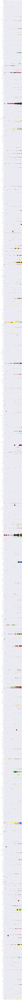

In [28]:
def plot_words_for_all_years(df,n=1000):
    colors=[]
    sizes=[]
    words=df.columns[:n]
    partys=sorted(set([index.split('|')[1] for index in df.index]))
    years=sorted(set([index.split('|')[0] for index in df.index]))
    
    for i, y_label in enumerate(words):
        for j, year in enumerate(years):
            summe=0
            max_party='AFD'
            max_value=0
            for k, party in enumerate(partys):
                try:
                    summand=df[y_label][f'{year}|{party}']

                    if summand>max_value:
                        max_value=summand
                        max_party=party

                    summe+=summand
                    max_party
                except KeyError:
                    summe+=0
            
            colors.append(color_of(max_party))
            sizes.append((summe*100)**2)
            
            

    heatmap(
        x=pd.Series(years),
        y=pd.Series(words),
        size=sizes,
        color=colors,
        figsize=(len(partys)*2,len(words)/1.5)
    )
    
plot_words_for_all_years(test_df)

D:\Anaconda\envs\stdenv\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


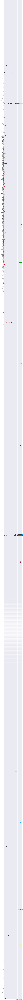

In [74]:
def plot_words_for_all_years(df,n=1000):
    colors=[]
    sizes=[]
    words=df.columns[:n]
    partys=sorted(set([index.split('|')[1] for index in df.index]))
    years=sorted(set([index.split('|')[0] for index in df.index]))
    ratios=[]
    for i, y_label in enumerate(words):
        
        for j, year in enumerate(years):
            summe=0
            max_party='AFD'
            max_value=0
            ratio=[]
            for k, party in enumerate(partys):
                try:
                    summand=df[y_label][f'{year}|{party}']

                    summe+=summand
                    ratio.append(summand)
                except KeyError:
                    summe+=0
                    ratio.append(0)
                    
            ratio=np.array(ratio)
            ratios.append(np.nan_to_num(ratio/ratio.sum()))
            sizes.append(summe)
            
    piemap(
        x=pd.Series(years),
        y=pd.Series(words),
        size=sizes,
        ratios=ratios,
        figsize=(len(partys)*2,len(words)/1.5)
    )
    
plot_words_for_all_years(test_df)